In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Any, List


def find_max(x):
    M = np.max(x)
    if M > 3:
        return np.ceil(M)
    elif M > 1:
        return np.ceil(10 * M) / 10
    elif M > 0.5:
        return 1
    elif M > 0.25:
        return 0.5
    else:
        return 0.25


def parse_max(M):
    if M > 3:
        return f"{int(M):d}"
    elif M > 0.5:
        return f"{M:.1f}"
    elif M > 0.25:
        return f"{M:.2f}"
    else:
        return f"{M:.2f}"


def pretty_barplot(
    x: np.ndarray,
    error_bar: np.ndarray = None,
    x_ticks: List[str] = None,
    title: str = None,
    colors: np.ndarray = None,
    fig: Any = None,
    gs: Any = None,
    ax: Any = None,
):

    if ax is None:
        if gs is not None:
            ax = plt.subplot(gs)
        else:
            if fig is None:
                fig = plt.figure(None, (6, 3))
            ax = fig.add_subplot(111)

    w = 0.8
    r = []
    M = find_max(x)
    for i in range(len(x)):
        ax.add_patch(plt.Rectangle((i, 0), width=w, height=x[i], clip_on=False, lw=1.0, ec="k", fc=colors[i]))

    if error_bar is not None:
        for i in range(len(x)):
            ax.add_line(
                plt.Line2D(
                    (i + w / 2.0, i + w / 2.0),
                    (x[i], x[i] + error_bar[i]),
                    linewidth=2,
                    color="k",
                    clip_on=False,
                )
            )

    gap = len(x) + w / 3.0
    tick_w = 2 * w / 6.0

    # x-axis
    ax.add_line(
        plt.Line2D((0, len(x) - w / 4.0), (-0.005 * M, -0.005 * M), linewidth=2, color="k", clip_on=False,)
    )

    # x-ticks
    for i in range(len(x)):
        ax.add_line(
            plt.Line2D(
                (i + w / 2.0, i + w / 2.0), (-0.005 * M, -0.05 * M), linewidth=1.5, color="k", clip_on=False,
            )
        )
        if x_ticks is not None:
            ax.text(
                i + w / 2.0,
                -0.07 * M,
                x_ticks[i],
                fontdict={"family": "sans-serif", "size": 15, "va": "top", "ha": "center"},
            )
    # y-axis
    ax.add_line(plt.Line2D((gap, gap), (0, M), linewidth=2, color="k", clip_on=False))

    # y-ticks
    ax.add_line(plt.Line2D((gap, gap + tick_w), (0, 0), linewidth=2, color="k", clip_on=False,))
    ax.add_line(plt.Line2D((gap, gap + tick_w / 2.0), (M / 2, M / 2), linewidth=2, color="k", clip_on=False,))
    ax.add_line(plt.Line2D((gap, gap + tick_w), (M, M), linewidth=2, color="k", clip_on=False,))
    ax.text(
        gap + 1.5 * tick_w, M, parse_max(M), fontdict={"family": "sans-serif", "size": 19, "va": "center"}
    )

    if title is not None:
        ax.text(
            -0.5, 0.75 * M, title, fontdict={"family": "sans-serif", "size": 25, "va": "top", "ha": "right"}
        )

    # Big Canvas to leave space for everything
    plt.ylim(-M * 0.1, 1.1 * M)
    plt.xlim(-0.1 * len(x), 1.2 * len(x))
    plt.axis("off")
    

In [3]:
from typing import Any
def scatter_viz(x: np.ndarray, y: np.ndarray, *args: Any, **kwargs: Any) -> Any:
    """A wrapper of scatter plot that guarantees that every point is visible in a very crowded scatterplot
    Args
    ----
    x: np.ndarray
        x axis coordinates
    y: np.ndarray
        y axis coordinates
    args and kwargs:
        positional and keyword arguments as in matplotplib.pyplot.scatter
    Returns
    -------
    Plots the graph and returns the axes object
    """
    ix_x_sort = np.argsort(x, kind="mergesort")
    ix_yx_sort = np.argsort(y[ix_x_sort], kind="mergesort")
    args_new = []
    kwargs_new = {}
    for arg in args:
        if type(arg) is np.ndarray:
            args_new.append(arg[ix_x_sort][ix_yx_sort])
        else:
            args_new.append(arg)
    for karg, varg in kwargs.items():
        if type(varg) is np.ndarray:
            kwargs_new[karg] = varg[ix_x_sort][ix_yx_sort]
        else:
            kwargs_new[karg] = varg
    ax = plt.scatter(
        x[ix_x_sort][ix_yx_sort], y[ix_x_sort][ix_yx_sort], *args_new, **kwargs_new
    )
    return ax

In [4]:
plt.rcParams["pdf.fonttype"] = 42 

In [5]:
sc.settings.set_figure_params(dpi=120)

In [6]:
from sklearn.svm import SVR

def filter_cv_vs_mean(S: np.ndarray, N: int, svr_gamma: float=None, plot: bool=True, min_expr_cells: int=2,
                      max_expr_avg: float=20, min_expr_avg: float=0) -> np.ndarray:
    muS = S.mean(1)
    detected_bool = ((S > 0).sum(1) > min_expr_cells) & (muS < max_expr_avg) & (muS > min_expr_avg)
    
    Sf = S[detected_bool, :]
    mu = Sf.mean(1)
    sigma = Sf.std(1, ddof=1)

    cv = sigma / mu
    log_m = np.log2(mu)
    log_cv = np.log2(cv)
    
    if svr_gamma is None:
        svr_gamma = 150. / len(mu)
    
    svr = SVR(gamma=svr_gamma)
    svr.fit(log_m[:, None], log_cv)
    fitted_fun = svr.predict
    ff = fitted_fun(log_m[:, None])
    score = log_cv - ff

    xnew = np.linspace(np.min(log_m), np.max(log_m))
    ynew = svr.predict(xnew[:, None])

    nth_score = np.sort(score)[::-1][N]
    
    if plot:
        plt.scatter(log_m[score > nth_score], log_cv[score > nth_score], s=3, alpha=0.4, c="tab:red")
        plt.scatter(log_m[score <= nth_score], log_cv[score <= nth_score], s=3, alpha=0.4, c="tab:blue")
        mu_linspace = np.linspace(np.min(log_m), np.max(log_m))
        plt.plot(mu_linspace, fitted_fun(mu_linspace[:, None]), c="k")
        plt.xlabel("log2 mean S")
        plt.ylabel("log2 CV S")
    
    cv_mean_score = np.zeros(detected_bool.shape)
    cv_mean_score[~detected_bool] = np.min(score) - 1e-16
    cv_mean_score[detected_bool] = score
    cv_mean_selected = cv_mean_score >= nth_score
    return cv_mean_selected

In [7]:
all_data_raw = sc.read_h5ad("ALL_VITRO_TIMECOURSE_DATA_RAW.h5ad")
all_data = all_data_raw.copy()

## Visualize global patterns for cell cycle and gene expression 

In [8]:
df = all_data.obs
df.groupby(["DAY", "CELL_LINE"])["DAY"].value_counts()

DAY  CELL_LINE  DAY
D0   HS980      D0     1016
D7   E1C3       D7      321
     HS980      D7     1811
     KARO1      D7      885
D14  E1C3       D14     180
     HS980      D14    1872
     KARO1      D14     463
D30  E1C3       D30    1153
     HS980      D30    1852
     KARO1      D30     841
D38  E1C3       D38    1602
     HS980      D38    1784
     KARO1      D38    1920
D45  E1C3       D45    1793
     HS980      D45    1707
     KARO1      D45    1638
D60  E1C3       D60    2792
     HS980      D60    1749
     KARO1      D60    1236
Name: DAY, dtype: int64

In [9]:
sc.pp.normalize_total(all_data)

In [10]:
S_genes_hum = ["MCM5", "PCNA", "TYMS", "FEN1", "MCM2", "MCM4", "RRM1", "UNG", "GINS2", 
            "MCM6", "CDCA7", "DTL", "PRIM1", "UHRF1", "CENPU", "HELLS", "RFC2", 
            "RPA2", "NASP", "RAD51AP1", "GMNN", "WDR76", "SLBP", "CCNE2", "UBR7", 
            "POLD3", "MSH2", "ATAD2", "RAD51", "RRM2", "CDC45", "CDC6", "EXO1", "TIPIN", 
            "DSCC1", "BLM", "CASP8AP2", "USP1", "CLSPN", "POLA1", "CHAF1B", "BRIP1", "E2F8"]
G2M_genes_hum = ["HMGB2", "CDK1", "NUSAP1", "UBE2C", "BIRC5", "TPX2", "TOP2A", "NDC80",
             "CKS2", "NUF2", "CKS1B", "MKI67", "TMPO", "CENPF", "TACC3", "PIMREG", 
             "SMC4", "CCNB2", "CKAP2L", "CKAP2", "AURKB", "BUB1", "KIF11", "ANP32E", 
             "TUBB4B", "GTSE1", "KIF20B", "HJURP", "CDCA3", "JPT1", "CDC20", "TTK",
             "CDC25C", "KIF2C", "RANGAP1", "NCAPD2", "DLGAP5", "CDCA2", "CDCA8", "ECT2", 
             "KIF23", "HMMR", "AURKA", "PSRC1", "ANLN", "LBR", "CKAP5", "CENPE", 
             "CTCF", "NEK2", "G2E3", "GAS2L3", "CBX5", "CENPA"]
sc.tl.score_genes_cell_cycle(all_data, s_genes=S_genes_hum, g2m_genes=G2M_genes_hum)

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [11]:
df = all_data.obs
res = df.groupby(["DAY"])["phase"].value_counts()/df.groupby(["DAY"])["DAY"].count()*100
res

DAY  phase
D0   G1       39.960630
     S        30.314961
     G2M      29.724409
D7   S        54.491216
     G2M      24.163076
     G1       21.345708
D14  G1       46.600398
     S        28.787276
     G2M      24.612326
D30  G1       83.515341
     G2M       9.516381
     S         6.968279
D38  G1       50.829250
     G2M      25.254429
     S        23.916321
D45  G1       92.565200
     G2M       4.320747
     S         3.114052
D60  G1       98.736368
     S         0.657781
     G2M       0.605851
dtype: float64

In [12]:
df = all_data.obs
res = df.groupby(["CELL_LINE", "DAY"])["phase"].value_counts()/df.groupby(["CELL_LINE", "DAY"])["DAY"].count()*100
res

CELL_LINE  DAY  phase
E1C3       D0   NaN            NaN
           D7   S        71.028037
                G2M      23.987539
                G1        4.984424
           D14  G1       55.000000
                S        25.000000
                G2M      20.000000
           D30  G1       85.516045
                G2M      11.968777
                S         2.515178
           D38  G1       48.127341
                S        26.966292
                G2M      24.906367
           D45  G1       98.103737
                G2M       1.338539
                S         0.557724
           D60  G1       98.889685
                G2M       0.680516
                S         0.429799
HS980      D0   G1       39.960630
                S        30.314961
                G2M      29.724409
           D7   S        52.070679
                G1       24.075097
                G2M      23.854224
           D14  G1       49.732906
                S        26.175214
                G2M      24.09188

In [13]:
d2n = {"D0":0, "D7":1, "D14":2, "D30":3, "D38":4, "D45":5, "D60":6}
res_dict = {x:{"G1":[], "S":[], "G2M":[]} for x in ["HS980", "KARO1", "E1C3"]}
for i in ["HS980", "KARO1", "E1C3"]:
    for j in ["D0", "D7", "D14", "D30", "D38", "D45", "D60"]:
        num = d2n[j]
        for k in ["G1", "S", "G2M"]:
            if (i, j,k) in res.index:
                res_dict[i][k].append(res[(i, j,k)])
            else:
                res_dict[i][k].append(0)

In [14]:
cyc_y = []
cyc_err = []
ncyc_y = []
ncyc_err = []
for d in ["D0", "D7", "D14", "D30", "D38", "D45", "D60"]:
    cycs = []
    ncycs = []
    if d == "D0":
        ncycs.append(res_dict["HS980"]["G1"][d2n[d]])
        cycs.append(res_dict["HS980"]["S"][d2n[d]]+res_dict["HS980"]["G2M"][d2n[d]])
    else:
        for c in ["HS980", "KARO1", "E1C3"]:
            ncycs.append(res_dict[c]["G1"][d2n[d]])
            cycs.append(res_dict[c]["S"][d2n[d]]+res_dict[c]["G2M"][d2n[d]])
    
    cyc_mean = np.mean(cycs)
    cyc_std = (np.std(cycs) / np.sqrt(3)) * 1.96
    cyc_y.append(cyc_mean)
    cyc_err.append(cyc_std)
    
    ncyc_mean = np.mean(ncycs)
    ncyc_std = (np.std(ncycs) / np.sqrt(3)) * 1.96
    ncyc_y.append(ncyc_mean)
    ncyc_err.append(ncyc_std)

In [15]:
ncyc_err[0] = 0
cyc_err[0] = 0

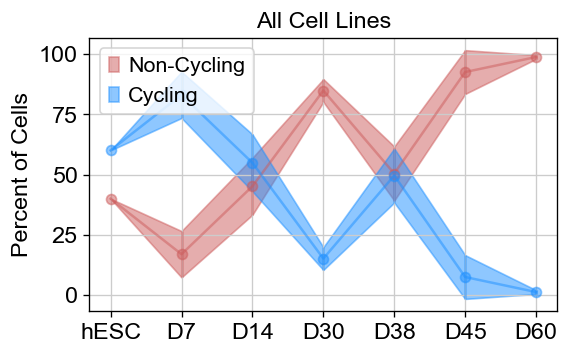

In [16]:
plt.figure(None, (5, 3))
plt.fill_between(range(0, 7), (np.array(ncyc_y)-np.array(ncyc_err)), (np.array(ncyc_y)+np.array(ncyc_err)), 
                 color='indianred', label="Non-Cycling", alpha=.5)
plt.fill_between(range(0, 7), (np.array(cyc_y)-np.array(cyc_err)), 
                 (np.array(cyc_y)+np.array(cyc_err)), color='dodgerblue', label="Cycling",alpha=.5)
plt.errorbar(range(0, 7), ncyc_y, c="indianred", yerr=ncyc_err, alpha=0.5, fmt='-o')
plt.errorbar(range(0, 7), cyc_y, c="dodgerblue", yerr=cyc_err, alpha=0.5, fmt='-o')
plt.xticks(range(0, 7), ["hESC", "D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("All Cell Lines")
plt.legend(loc="upper left")
plt.ylabel("Percent of Cells")
plt.show()

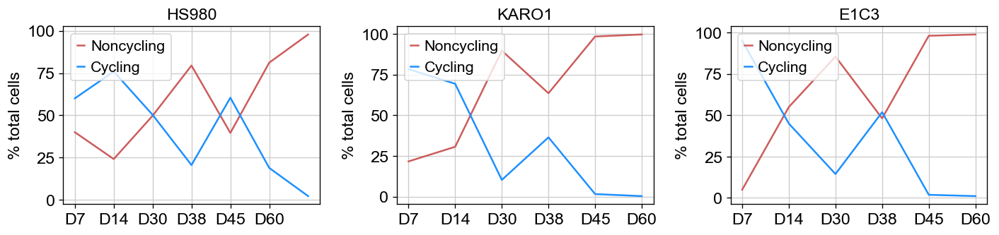

In [17]:
plt.figure(None, (12, 3))
gs = plt.GridSpec(1, 3)

plt.subplot(gs[0,0])
plt.plot(res_dict["HS980"]["G1"], c="indianred", label="Noncycling")
plt.plot(np.array(res_dict["HS980"]["S"])+np.array(res_dict["HS980"]["G2M"]), c="dodgerblue", label="Cycling")
plt.xticks(range(0, 6), ["D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("HS980")
plt.legend(loc="upper left")
plt.ylabel("% total cells")

plt.subplot(gs[0,1])
plt.plot(res_dict["KARO1"]["G1"][1:], c="indianred", label="Noncycling")
plt.plot(np.array(res_dict["KARO1"]["S"][1:])+np.array(res_dict["KARO1"]["G2M"][1:]), c="dodgerblue", label="Cycling")
plt.xticks(range(0, 6), ["D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("KARO1")
plt.legend(loc="upper left")
plt.ylabel("% total cells")


plt.subplot(gs[0,2])
plt.plot(res_dict["E1C3"]["G1"][1:], c="indianred", label="Noncycling")
plt.plot(np.array(res_dict["E1C3"]["S"][1:])+np.array(res_dict["E1C3"]["G2M"][1:]), c="dodgerblue", label="Cycling")
plt.xticks(range(0, 6), ["D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("E1C3")
plt.legend(loc="upper left")
plt.ylabel("% total cells")

plt.tight_layout()
plt.show()

In [18]:
name2phase = {i:j for i,j in zip(all_data.obs.index, all_data.obs["phase"])}
all_data_raw.obs["phase"] = [i for i in all_data.obs["phase"]]

In [19]:
all_data = all_data_raw.copy()
sc.pp.filter_genes(all_data, min_cells=20)
sc.pp.normalize_total(all_data)
sc.pp.log1p(all_data)

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [20]:
all_data_HS980 = all_data[all_data.obs["CELL_LINE"]=="HS980"].copy()
all_data_E1C3 = all_data[all_data.obs["CELL_LINE"]=="E1C3"].copy()
all_data_KARO1 = all_data[all_data.obs["CELL_LINE"]=="KARO1"].copy()

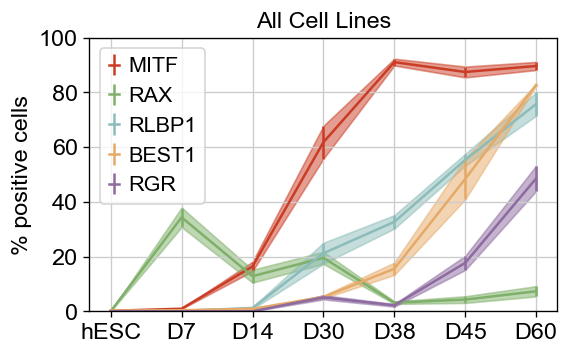

In [21]:
all_data.obs["RAX+"] = all_data.X[:, np.where(all_data.var.index=="RAX")[0][0]].toarray()>0.50
all_data.obs["MITF+"] = all_data.X[:, np.where(all_data.var.index=="MITF")[0][0]].toarray()>0.50
all_data.obs["RLBP1+"] = all_data.X[:, np.where(all_data.var.index=="RLBP1")[0][0]].toarray()>0.50
all_data.obs["BEST1+"] = all_data.X[:, np.where(all_data.var.index=="BEST1")[0][0]].toarray()>0.50
all_data.obs["RGR+"] = all_data.X[:, np.where(all_data.var.index=="RGR")[0][0]].toarray()>0.50

d2n = {"D0":0, "D7":1, "D14":2, "D30":3, "D38":4, "D45":5, "D60":6}
res_dict  = {"MITF+":[], "RLBP1+":[], "RAX+":[], "BEST1+":[], "RGR+":[]}
std_dict = {"MITF+":[], "RLBP1+":[], "RAX+":[], "BEST1+":[], "RGR+":[]}
for j in ["D0", "D7", "D14", "D30", "D38", "D45", "D60"]:
    num = d2n[j]
    for k in ["RAX+", "MITF+", "RLBP1+", "BEST1+", "RGR+"]:
        x = all_data[all_data.obs["DAY"]==j]
        n1 = sum(x[x.obs["CELL_LINE"]=="HS980"].obs[k])/x[x.obs["CELL_LINE"]=="HS980"].n_obs*100
        if j!= "D0":
            n2 = sum(x[x.obs["CELL_LINE"]=="KARO1"].obs[k])/x[x.obs["CELL_LINE"]=="KARO1"].n_obs*100
            n3 = sum(x[x.obs["CELL_LINE"]=="E1C3"].obs[k])/x[x.obs["CELL_LINE"]=="E1C3"].n_obs*100
            res_dict[k].append(np.mean([n1, n2, n3]))
            std_dict[k].append(np.std([n1, n2, n3])/ (np.sqrt(3) * 1.96))
        else:
            res_dict[k].append(n1)
            std_dict[k].append(0)
                               
        
plt.figure(None, (5, 3))
plt.fill_between(range(0, 7), (np.array(res_dict["MITF+"])-np.array(std_dict["MITF+"])), 
                 (np.array(res_dict["MITF+"])+np.array(std_dict["MITF+"])), 
                 color='#CA3C25', alpha=.5)
plt.fill_between(range(0, 7), (np.array(res_dict["RAX+"])-np.array(std_dict["RAX+"])), 
                 (np.array(res_dict["RAX+"])+np.array(std_dict["RAX+"])), 
                 color='#7FB069', alpha=.5)
plt.fill_between(range(0, 7), (np.array(res_dict["RLBP1+"])-np.array(std_dict["RLBP1+"])), 
                 (np.array(res_dict["RLBP1+"])+np.array(std_dict["RLBP1+"])), 
                 color='#8CBCB9', alpha=.5)
plt.fill_between(range(0, 7), (np.array(res_dict["BEST1+"])-np.array(std_dict["BEST1+"])), 
                 (np.array(res_dict["BEST1+"])+np.array(std_dict["BEST1+"])), 
                 color='#E6AA68', alpha=.5)
plt.fill_between(range(0, 7), (np.array(res_dict["RGR+"])-np.array(std_dict["RGR+"])), 
                 (np.array(res_dict["RGR+"])+np.array(std_dict["RGR+"])), 
                 color='#8D6A9F', alpha=.5)
plt.errorbar(range(0, 7), res_dict["MITF+"], yerr=std_dict["MITF+"], c="#CA3C25", label="MITF")
plt.errorbar(range(0, 7), res_dict["RAX+"], yerr=std_dict["RAX+"], c="#7FB069", label="RAX")
plt.errorbar(range(0, 7), res_dict["RLBP1+"], yerr=std_dict["RLBP1+"], c="#8CBCB9", label="RLBP1")
plt.errorbar(range(0, 7), res_dict["BEST1+"], yerr=std_dict["BEST1+"], c="#E6AA68", label="BEST1")
plt.errorbar(range(0, 7), res_dict["RGR+"], yerr=std_dict["RGR+"], c="#8D6A9F", label="RGR")
plt.xticks(range(0, 7), ["hESC", "D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("All Cell Lines")
plt.legend()
plt.ylim(0, 100)
plt.ylabel("% positive cells")
plt.show()

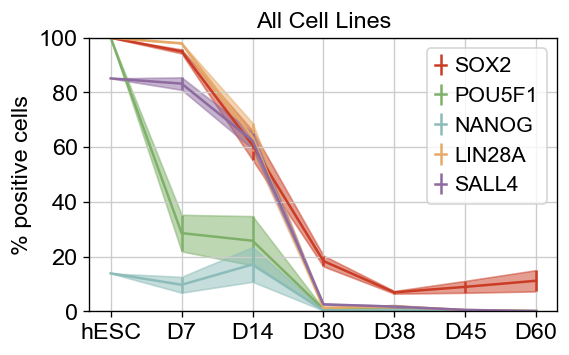

In [22]:
all_data.obs["SOX2+"] = all_data.X[:, np.where(all_data.var.index=="SOX2")[0][0]].toarray()>0.50
all_data.obs["POU5F1+"] = all_data.X[:, np.where(all_data.var.index=="POU5F1")[0][0]].toarray()>0.50
all_data.obs["NANOG+"] = all_data.X[:, np.where(all_data.var.index=="NANOG")[0][0]].toarray()>0.50
all_data.obs["LIN28A+"] = all_data.X[:, np.where(all_data.var.index=="LIN28A")[0][0]].toarray()>0.50
all_data.obs["SALL4+"] = all_data.X[:, np.where(all_data.var.index=="SALL4")[0][0]].toarray()>0.50

d2n = {"D0":0, "D7":1, "D14":2, "D30":3, "D38":4, "D45":5, "D60":6}
res_dict  = {"SOX2+":[], "POU5F1+":[], "NANOG+":[], "LIN28A+":[], "SALL4+":[]}
std_dict = {"SOX2+":[], "POU5F1+":[], "NANOG+":[], "LIN28A+":[], "SALL4+":[]}
for j in ["D0", "D7", "D14", "D30", "D38", "D45", "D60"]:
    num = d2n[j]
    for k in ["SOX2+", "POU5F1+", "NANOG+", "LIN28A+", "SALL4+"]:
        x = all_data[all_data.obs["DAY"]==j]
        n1 = sum(x[x.obs["CELL_LINE"]=="HS980"].obs[k])/x[x.obs["CELL_LINE"]=="HS980"].n_obs*100
        if j!= "D0":
            n2 = sum(x[x.obs["CELL_LINE"]=="KARO1"].obs[k])/x[x.obs["CELL_LINE"]=="KARO1"].n_obs*100
            n3 = sum(x[x.obs["CELL_LINE"]=="E1C3"].obs[k])/x[x.obs["CELL_LINE"]=="E1C3"].n_obs*100
            res_dict[k].append(np.mean([n1, n2, n3]))
            std_dict[k].append(np.std([n1, n2, n3])/ (np.sqrt(3) * 1.96))
        else:
            res_dict[k].append(n1)
            std_dict[k].append(0)
                               
        
plt.figure(None, (5, 3))
plt.fill_between(range(0, 7), (np.array(res_dict["SOX2+"])-np.array(std_dict["SOX2+"])), 
                 (np.array(res_dict["SOX2+"])+np.array(std_dict["SOX2+"])), 
                 color='#CA3C25', alpha=.5)
plt.fill_between(range(0, 7), (np.array(res_dict["POU5F1+"])-np.array(std_dict["POU5F1+"])), 
                 (np.array(res_dict["POU5F1+"])+np.array(std_dict["POU5F1+"])), 
                 color='#7FB069', alpha=.5)
plt.fill_between(range(0, 7), (np.array(res_dict["NANOG+"])-np.array(std_dict["NANOG+"])), 
                 (np.array(res_dict["NANOG+"])+np.array(std_dict["NANOG+"])), 
                 color='#8CBCB9', alpha=.5)
plt.fill_between(range(0, 7), (np.array(res_dict["LIN28A+"])-np.array(std_dict["LIN28A+"])), 
                 (np.array(res_dict["LIN28A+"])+np.array(std_dict["LIN28A+"])), 
                 color='#E6AA68', alpha=.5)
plt.fill_between(range(0, 7), (np.array(res_dict["SALL4+"])-np.array(std_dict["SALL4+"])), 
                 (np.array(res_dict["SALL4+"])+np.array(std_dict["SALL4+"])), 
                 color='#8D6A9F', alpha=.5)

plt.errorbar(range(0, 7), res_dict["SOX2+"], yerr=std_dict["SOX2+"], c="#CA3C25", label="SOX2")
plt.errorbar(range(0, 7), res_dict["POU5F1+"], yerr=std_dict["POU5F1+"], c="#7FB069", label="POU5F1")
plt.errorbar(range(0, 7), res_dict["NANOG+"], yerr=std_dict["NANOG+"], c="#8CBCB9", label="NANOG")
plt.errorbar(range(0, 7), res_dict["LIN28A+"], yerr=std_dict["LIN28A+"], c="#E6AA68", label="LIN28A")
plt.errorbar(range(0, 7), res_dict["SALL4+"], yerr=std_dict["SALL4+"], c="#8D6A9F", label="SALL4")

plt.xticks(range(0, 7), ["hESC", "D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("All Cell Lines")
plt.legend()
plt.ylim(0, 100)
plt.ylabel("% positive cells")
plt.show()

In [23]:
d2n = {"D7":1, "D14":2, "D30":3, "D38":4, "D45":5, "D60":6}
res_dict = {}
for i in ["HS980", "KARO1", "E1C3"]:
    res_dict[i] = {"MITF+":[], "RLBP1+":[], "RAX+":[], "BEST1+":[], "RGR+":[]}
    for j in ["D7", "D14", "D30", "D38", "D45", "D60"]:
        num = d2n[j]
        for k in ["RAX+", "MITF+", "RLBP1+", "BEST1+", "RGR+"]:
            x = all_data[all_data.obs["DAY"]==j]
            x = x[x.obs["CELL_LINE"]==i]
            res_dict[i][k].append(sum(x.obs[k])/len(x.obs[k])*100)

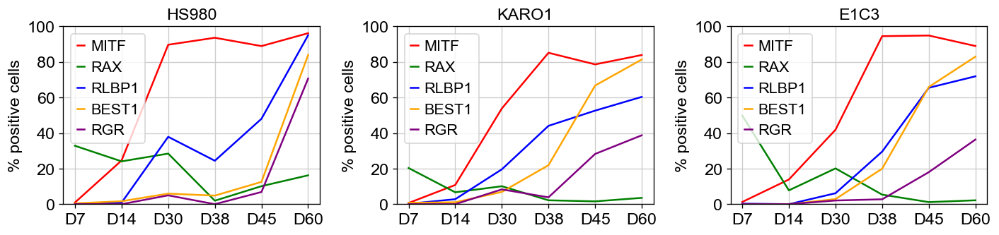

In [24]:
plt.figure(None, (12, 3))
gs = plt.GridSpec(1, 3)

plt.subplot(gs[0,0])
plt.plot(res_dict["HS980"]["MITF+"], c="red", label="MITF")
plt.plot(res_dict["HS980"]["RAX+"], c="green", label="RAX")
plt.plot(res_dict["HS980"]["RLBP1+"], c="blue", label="RLBP1")
plt.plot(res_dict["HS980"]["BEST1+"], c="orange", label="BEST1")
plt.plot(res_dict["HS980"]["RGR+"], c="purple", label="RGR")
plt.xticks(range(0, 6), ["D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("HS980")
plt.legend()
plt.ylim(0, 100)
plt.ylabel("% positive cells")

plt.subplot(gs[0,1])
plt.plot(res_dict["KARO1"]["MITF+"], c="red", label="MITF")
plt.plot(res_dict["KARO1"]["RAX+"], c="green", label="RAX")
plt.plot(res_dict["KARO1"]["RLBP1+"], c="blue", label="RLBP1")
plt.plot(res_dict["KARO1"]["BEST1+"], c="orange", label="BEST1")
plt.plot(res_dict["KARO1"]["RGR+"], c="purple", label="RGR")
plt.xticks(range(0, 6), ["D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("KARO1")
plt.legend()
plt.ylim(0, 100)
plt.ylabel("% positive cells")

plt.subplot(gs[0,2])
plt.plot(res_dict["E1C3"]["MITF+"], c="red", label="MITF")
plt.plot(res_dict["E1C3"]["RAX+"], c="green", label="RAX")
plt.plot(res_dict["E1C3"]["RLBP1+"], c="blue", label="RLBP1")
plt.plot(res_dict["E1C3"]["BEST1+"], c="orange", label="BEST1")
plt.plot(res_dict["E1C3"]["RGR+"], c="purple", label="RGR")
plt.xticks(range(0, 6), ["D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("E1C3")
plt.legend()
plt.ylim(0, 100)
plt.ylabel("% positive cells")

plt.tight_layout()
plt.show()

In [25]:
all_data.obs["SOX2+"] = all_data.X[:, np.where(all_data.var.index=="SOX2")[0][0]].toarray()>0.50
all_data.obs["POU5F1+"] = all_data.X[:, np.where(all_data.var.index=="POU5F1")[0][0]].toarray()>0.50
all_data.obs["NANOG+"] = all_data.X[:, np.where(all_data.var.index=="NANOG")[0][0]].toarray()>0.50
all_data.obs["LIN28A+"] = all_data.X[:, np.where(all_data.var.index=="LIN28A")[0][0]].toarray()>0.50
all_data.obs["SALL4+"] = all_data.X[:, np.where(all_data.var.index=="SALL4")[0][0]].toarray()>0.50

d2n = {"D7":1, "D14":2, "D30":3, "D38":4, "D45":5, "D60":6}
res_dict = {}
for i in ["HS980", "KARO1", "E1C3"]:
    res_dict[i] = {"SOX2+":[], "POU5F1+":[], "NANOG+":[], "LIN28A+":[], "SALL4+":[]}
    for j in ["D7", "D14", "D30", "D38", "D45", "D60"]:
        num = d2n[j]
        for k in ["SOX2+", "POU5F1+", "NANOG+", "LIN28A+", "SALL4+"]:
            x = all_data[all_data.obs["DAY"]==j]
            x = x[x.obs["CELL_LINE"]==i]
            res_dict[i][k].append(sum(x.obs[k])/len(x.obs[k])*100)

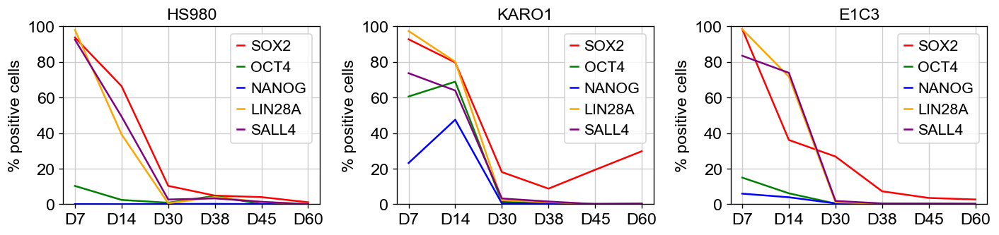

In [26]:
plt.figure(None, (12, 3))
gs = plt.GridSpec(1, 3)

plt.subplot(gs[0,0])
plt.plot(res_dict["HS980"]["SOX2+"], c="red", label="SOX2")
plt.plot(res_dict["HS980"]["POU5F1+"], c="green", label="OCT4")
plt.plot(res_dict["HS980"]["NANOG+"], c="blue", label="NANOG")
plt.plot(res_dict["HS980"]["LIN28A+"], c="orange", label="LIN28A")
plt.plot(res_dict["HS980"]["SALL4+"], c="purple", label="SALL4")
plt.xticks(range(0, 6), ["D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("HS980")
plt.legend()
plt.ylim(0, 100)
plt.ylabel("% positive cells")

plt.subplot(gs[0,1])
plt.plot(res_dict["KARO1"]["SOX2+"], c="red", label="SOX2")
plt.plot(res_dict["KARO1"]["POU5F1+"], c="green", label="OCT4")
plt.plot(res_dict["KARO1"]["NANOG+"], c="blue", label="NANOG")
plt.plot(res_dict["KARO1"]["LIN28A+"], c="orange", label="LIN28A")
plt.plot(res_dict["KARO1"]["SALL4+"], c="purple", label="SALL4")
plt.xticks(range(0, 6), ["D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("KARO1")
plt.legend()
plt.ylim(0, 100)
plt.ylabel("% positive cells")


plt.subplot(gs[0,2])
plt.plot(res_dict["E1C3"]["SOX2+"], c="red", label="SOX2")
plt.plot(res_dict["E1C3"]["POU5F1+"], c="green", label="OCT4")
plt.plot(res_dict["E1C3"]["NANOG+"], c="blue", label="NANOG")
plt.plot(res_dict["E1C3"]["LIN28A+"], c="orange", label="LIN28A")
plt.plot(res_dict["E1C3"]["SALL4+"], c="purple", label="SALL4")
plt.xticks(range(0, 6), ["D7", "D14", "D30", "D38", "D45", "D60"])
plt.title("E1C3")
plt.legend()
plt.ylim(0, 100)
plt.ylabel("% positive cells")

plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


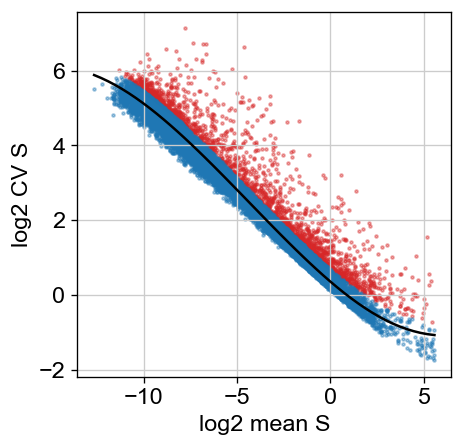

In [27]:
all_data_norm = all_data_raw.copy()
sc.pp.filter_genes(all_data_norm, min_cells=20)
sc.pp.normalize_total(all_data_norm)
cv_vs_mean_keep = filter_cv_vs_mean(all_data_norm.X.toarray().T, N=2000, max_expr_avg=50)
sc.pp.log1p(all_data_norm)
all_data_norm = all_data_norm[:, cv_vs_mean_keep].copy()

In [28]:
sc.pp.scale(all_data_norm, max_value=10)
sc.tl.pca(all_data_norm, svd_solver='arpack')

... storing 'phase' as categorical


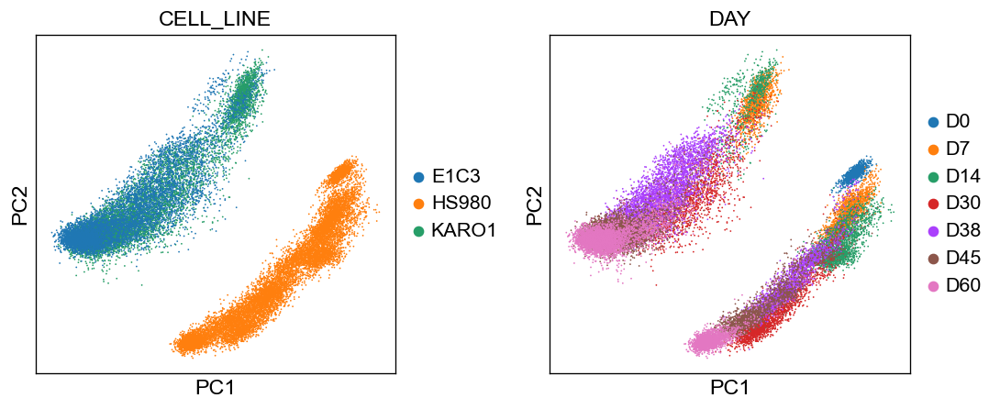

In [29]:
sc.pl.pca(all_data_norm, color=['CELL_LINE', "DAY"], wspace=0.3)

## Obtain global PCA representation of the time course

In [30]:
import integration as seurat
adata_integrate_init = all_data_raw.copy()

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = 

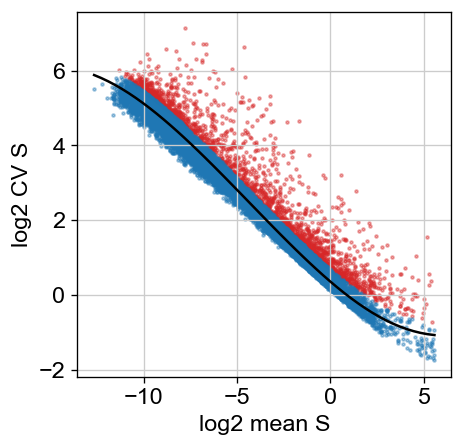

In [31]:
sc.pp.filter_genes(adata_integrate_init, min_cells=20)
sc.pp.normalize_total(adata_integrate_init)
sc.tl.score_genes_cell_cycle(adata_integrate_init, s_genes=S_genes_hum, g2m_genes=G2M_genes_hum)
cv_vs_mean_keep = filter_cv_vs_mean(adata_integrate_init.X.toarray().T, N=2000, max_expr_avg=50)
adata_integrate_init = adata_integrate_init[:, cv_vs_mean_keep].copy()

In [32]:
sc.pp.log1p(adata_integrate_init)

In [33]:
b0 = adata_integrate_init[adata_integrate_init.obs["CELL_LINE"].isin(["KARO1"])].copy()
b1 = adata_integrate_init[adata_integrate_init.obs["CELL_LINE"]=="E1C3"].copy()
b2 = adata_integrate_init[adata_integrate_init.obs["CELL_LINE"]=="HS980"].copy()

In [34]:
b0_dict = {}
b1_dict = {}
b0_dict["normalized_array"] = np.array(b0.X.toarray())
b1_dict["normalized_array"] = np.array(b1.X.toarray())
b0_dict["GeneID"] = np.array(b0.var.index)
b1_dict["GeneID"] = np.array(b1.var.index)
anchor_pairs, anchor_scores, indicators_pairs = seurat.find_integration_anchors(
    object_list = [b0_dict, b1_dict],
    dims=20,
    anchor_features=b0.shape[1],
    normalization_method=None,
    dim_reduction="crossSVD")
b0_integrated, b1_integrated = seurat.run_integration(data_matrices = (b0_dict["normalized_array"], 
                                                                              b1_dict["normalized_array"]),
                                                             anchor_pairs=anchor_pairs,
                                                             anchor_score = anchor_scores)

adata_integrated =  sc.AnnData(b0_integrated).concatenate(sc.AnnData(b1_integrated))

adata_integrated.var.index = b0.var.index

In [35]:
b0_dict = {}
b1_dict = {}
b0_dict["normalized_array"] = np.array(adata_integrated.X)
b1_dict["normalized_array"] = np.array(b2.X.toarray())
b0_dict["GeneID"] = np.array(b0.var.index)
b1_dict["GeneID"] = np.array(b1.var.index)

anchor_pairs, anchor_scores, indicators_pairs = seurat.find_integration_anchors(
    object_list = [b0_dict, b1_dict],
    dims=20,
    anchor_features=b0.shape[1],
    normalization_method=None,
    dim_reduction="crossSVD")

b0_integrated, b1_integrated = seurat.run_integration(data_matrices = (b0_dict["normalized_array"], 
                                                                              b1_dict["normalized_array"]),
                                                             anchor_pairs=anchor_pairs,
                                                             anchor_score = anchor_scores)

adata_integrated =  sc.AnnData(b0_integrated).concatenate(sc.AnnData(b1_integrated))

In [36]:
adata_integrated

AnnData object with n_obs × n_vars = 26615 × 2001
    obs: 'batch'

In [37]:
adata_integrated.var.index = b0.var.index
tmp = b0.concatenate([b1, b2])

adata_integrated.obs["CELL_LINE"] = [i for i in tmp.obs["CELL_LINE"]]
adata_integrated.obs["DAY"] = [i for i in tmp.obs["DAY"]]
sc.tl.pca(adata_integrated, svd_solver='arpack')

... storing 'CELL_LINE' as categorical
... storing 'DAY' as categorical


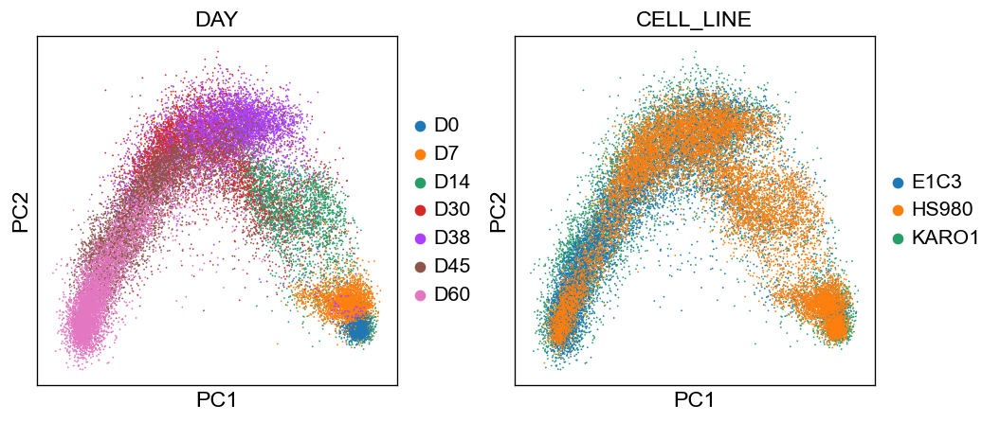

In [38]:
sc.pl.pca(adata_integrated, color=["DAY", "CELL_LINE"])

In [39]:
adata_integrate_init_norm = all_data_raw.copy()

In [40]:
adata_integrated.obs.index = tmp.obs.index

In [41]:
x = [i.split("-")[0] for i in adata_integrated.obs.index]
x2 = [i+"-"+j+"-"+k for i,j,k in zip(x, adata_integrated.obs["CELL_LINE"], adata_integrated.obs["DAY"])]

In [42]:
adata_integrate_init_norm.obs.index = [i.split("-")[0]+"-"+j+"-"+k for i,j,k in zip(adata_integrate_init_norm.obs.index, 
                                                                                    adata_integrate_init_norm.obs["CELL_LINE"], 
                                                                                    adata_integrate_init_norm.obs["DAY"])]

In [43]:
adata_integrate_init_norm = adata_integrate_init_norm[x2, :].copy()

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [44]:
adata_integrate_init_norm.obsm["X_pca"] = adata_integrated.obsm["X_pca"]

... storing 'phase' as categorical


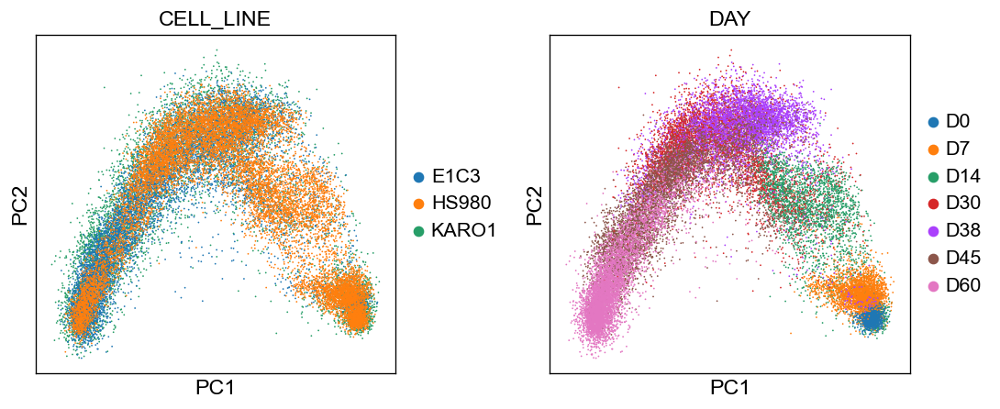

In [45]:
sc.pl.pca(adata_integrate_init_norm, color=["CELL_LINE", "DAY"], wspace=0.3)

In [46]:
pc0 = adata_integrate_init_norm.obsm["X_pca"][:, 0]
pc1 = adata_integrate_init_norm.obsm["X_pca"][:, 1]

In [47]:
adata_integrate_init_norm.obsm["X_pca"] = np.vstack([pc1*-1, pc0]).T

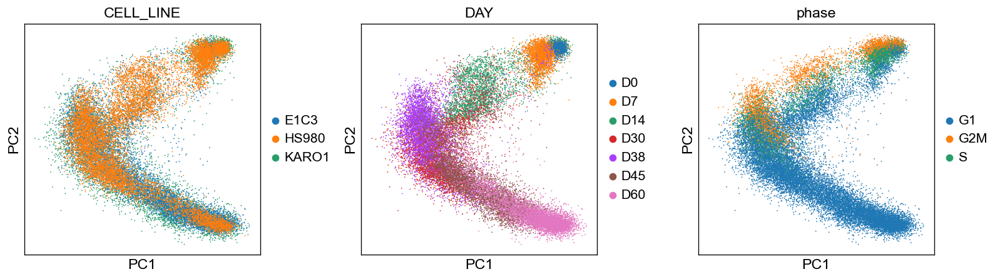

In [48]:
sc.pl.pca(adata_integrate_init_norm, color=["CELL_LINE", "DAY", "phase"], wspace=0.3)

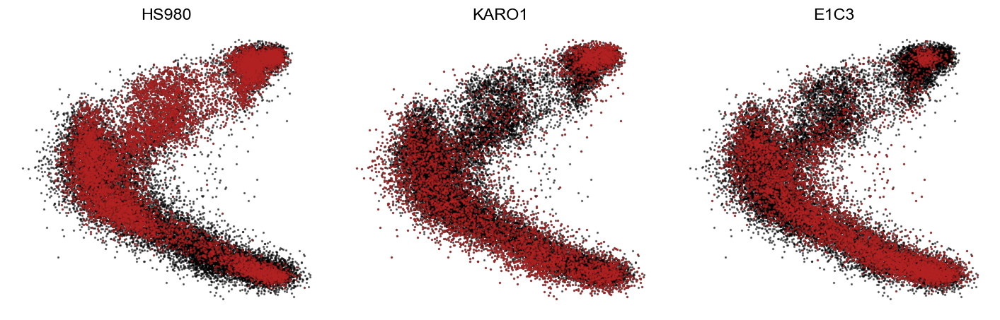

In [49]:
plt.figure(None, (12, 4))
gs = plt.GridSpec(1, 3)
for j, curr_day in zip([0, 1, 2], ["HS980", "KARO1", "E1C3"]):
    em = adata_integrate_init_norm.obsm["X_pca"]
    plt.subplot(gs[0,j])
    scatter_viz(em[:, 0], em[:, 1], s=1, alpha=0.5,
                c="black", rasterized=True)
    
    em = adata_integrate_init_norm[adata_integrate_init_norm.obs["CELL_LINE"]==curr_day].obsm["X_pca"]
    scatter_viz(em[:, 0], em[:, 1], s=1, alpha=0.5,
                c="firebrick", rasterized=True)
    plt.title(curr_day)
    plt.axis("off")
plt.tight_layout()
plt.show()

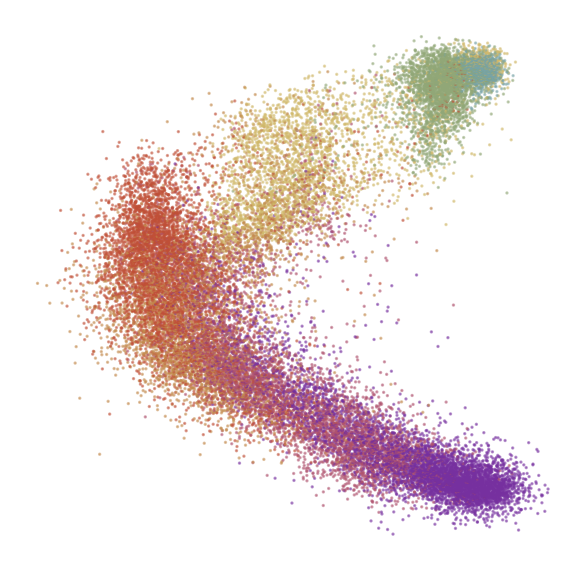

In [50]:
d2c = {"D0":(120/255, 163/255, 167/255), "D7":(145/255, 167/255, 119/255), 
       "D14":(208/255, 184/255, 105/255), "D30":(195/255, 138/255, 77/255), 
       "D38":(192/255, 79/255, 55/255), "D45":(175/255, 82/255, 110/255), "D60":(118/255, 48/255, 159/255)}
em = adata_integrate_init_norm.obsm["X_pca"]

plt.figure(None, (6, 6))
scatter_viz(em[:, 0], em[:, 1], s=1, 
            c=np.array([d2c[i] for i in adata_integrate_init_norm.obs["DAY"]]), alpha=0.5, 
            cmap="inferno", rasterized=True)
plt.axis("off")
plt.show()

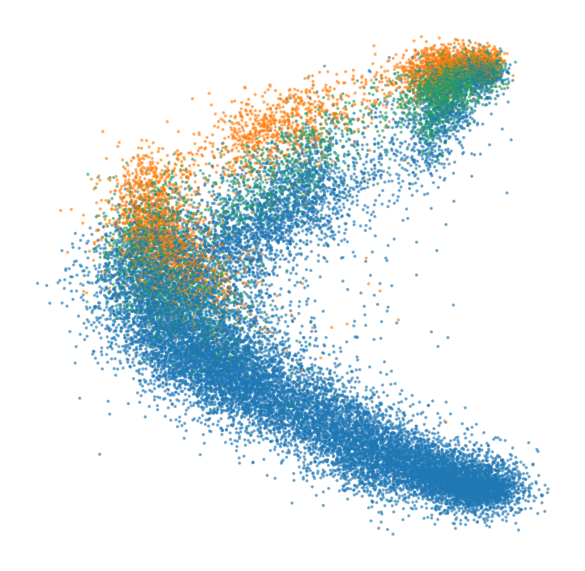

In [51]:
phase2color = {"G2M":"#ff7f0e", "S":"#279e68", "G1":"#1f77b4"}

em = adata_integrate_init_norm.obsm["X_pca"]

plt.figure(None, (6, 6))
scatter_viz(em[:, 0], em[:, 1], s=1, 
            c=np.array([phase2color[i] for i in adata_integrate_init_norm.obs["phase"]]), alpha=0.5, 
            cmap="inferno", rasterized=True)
plt.axis("off")
plt.show()

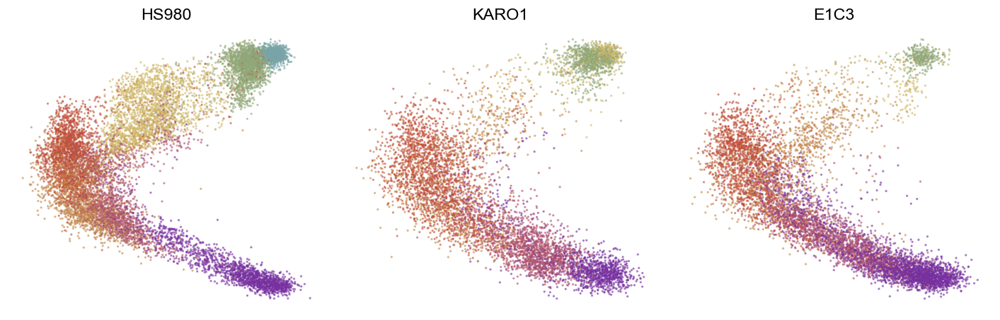

In [52]:
plt.figure(None, (12, 4))
gs = plt.GridSpec(1, 3)

plt.subplot(gs[0,0])
adata_hs980 = adata_integrate_init_norm[adata_integrate_init_norm.obs["CELL_LINE"]=="HS980"]
em = adata_hs980.obsm["X_pca"]
scatter_viz(em[:, 0], em[:, 1], s=1, 
            c=np.array([d2c[i] for i in adata_hs980.obs["DAY"]]), alpha=0.5, 
            cmap="inferno", rasterized=True)
plt.title("HS980")
plt.axis("off")


plt.subplot(gs[0,1])
adata_karo1 = adata_integrate_init_norm[adata_integrate_init_norm.obs["CELL_LINE"]=="KARO1"]
em = adata_karo1.obsm["X_pca"]
scatter_viz(em[:, 0], em[:, 1], s=1, 
            c=np.array([d2c[i] for i in adata_karo1.obs["DAY"]]), alpha=0.5, 
            cmap="inferno", rasterized=True)
plt.title("KARO1")
plt.axis("off")

plt.subplot(gs[0,2])
adata_e1c3 = adata_integrate_init_norm[adata_integrate_init_norm.obs["CELL_LINE"]=="E1C3"]
em = adata_e1c3.obsm["X_pca"]
scatter_viz(em[:, 0], em[:, 1], s=1, 
            c=np.array([d2c[i] for i in adata_e1c3.obs["DAY"]]), alpha=0.5, 
            cmap="inferno", rasterized=True)
plt.title("E1C3")
plt.axis("off")

plt.tight_layout()
plt.show()

## Signature score analysis

In [53]:
adata = adata_integrate_init_norm.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [54]:
pluripotent_marker_genes = ['SOX2', 'POU5F1', 'NANOG', 'ZFP42', 'LIN28A', 'SALL4']
progenitor_marker_genes = ["RAX", "OTX2", "ZIC2", "PAX6", "SIX3", "SIX6", "LHX2", "SFRP2", "CRABP1", "VSX2"]
rpe_marker_genes = ['TMEFF2', 'SERPINF1', 'MITF', 'PMEL', 'DCT', 'ELN', 'TYRP1', 'TYR', 'RLBP1', 'BEST1',
                   'RPE65', 'TTR', 'RGR', 'SFRP5', 'SLC6A13']

all_sig_genes = pluripotent_marker_genes+progenitor_marker_genes+rpe_marker_genes
em = adata.obsm["X_pca"]

df = pd.DataFrame(adata[:, rpe_marker_genes].X.toarray())
df = (df-df.min())/(df.max()-df.min())
df = np.array(df.sum(1))

adata.obs["RPE Signature"] = (df-df.min())/(df.max()-df.min())

df = pd.DataFrame(adata[:, progenitor_marker_genes].X.toarray())
df = (df-df.min())/(df.max()-df.min())
df = np.array(df.sum(1))

adata.obs["Retinal Progenitor Signature"] = (df-df.min())/(df.max()-df.min())

df = pd.DataFrame(adata[:, pluripotent_marker_genes].X.toarray())
df = (df-df.min())/(df.max()-df.min())
df = np.array(df.sum(1))

adata.obs["Pluripotency Signature"] = (df-df.min())/(df.max()-df.min())

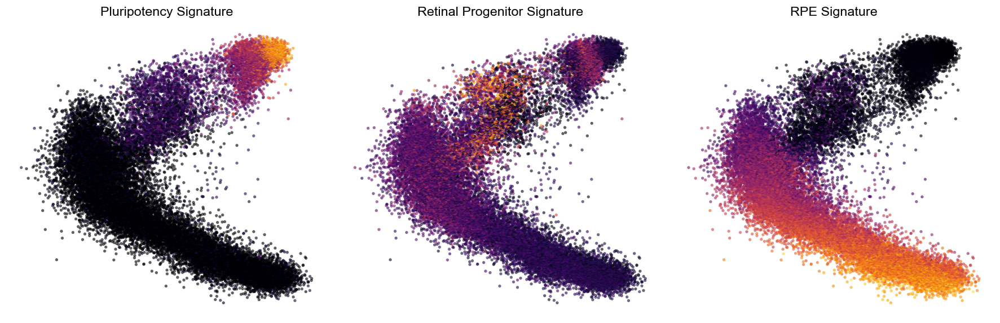

In [55]:
plt.figure(None, (15, 5))
gs = plt.GridSpec(1, 3)
sigs = ["Pluripotency Signature", "Retinal Progenitor Signature", "RPE Signature"]
c=0
for i in range(0, 1):
    for j in range(0, 3):
        plt.subplot(gs[i,j])
        plt.title(sigs[c])
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.axis("off")
        scatter_viz(em[:, 0], em[:, 1], s=5, alpha=0.5, c=np.array(adata.obs[sigs[c]]), cmap="inferno", rasterized=True)
        c+=1
plt.tight_layout()
plt.show()

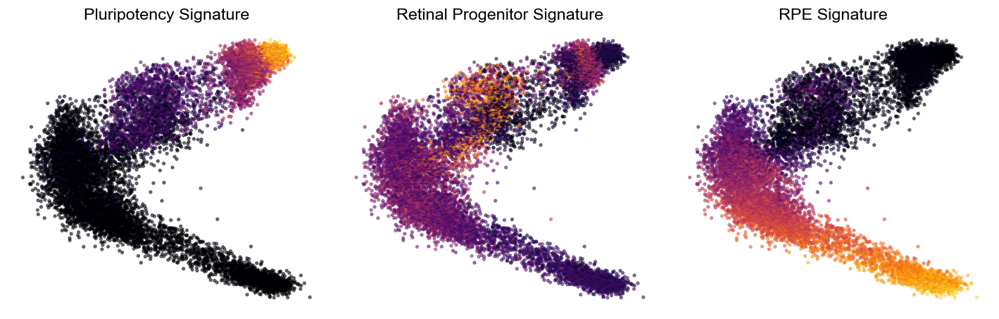

In [56]:
adata2 = adata[adata.obs["CELL_LINE"]=="HS980"].copy()
em2 = adata2.obsm["X_pca"]

plt.figure(None, (16, 4))
gs = plt.GridSpec(1, 4)
sigs = ["Pluripotency Signature", "Retinal Progenitor Signature", "RPE Signature"]
c=0
for i in range(0, 1):
    for j in range(0, 3):
        plt.subplot(gs[i,j])
        plt.title(sigs[c])
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.axis("off")
        scatter_viz(em2[:, 0], em2[:, 1], s=5, alpha=0.5, c=np.array(adata2.obs[sigs[c]]), cmap="inferno", rasterized=True)
        c+=1
plt.tight_layout()
plt.show()

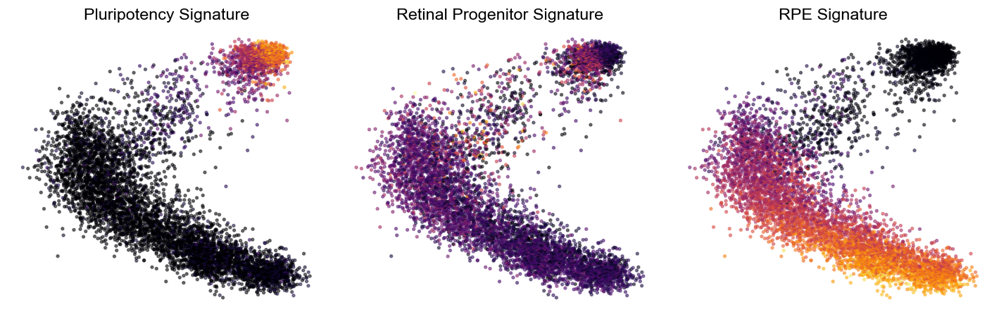

In [57]:
adata2 = adata[adata.obs["CELL_LINE"]=="KARO1"].copy()
em2 = adata2.obsm["X_pca"]

plt.figure(None, (16, 4))
gs = plt.GridSpec(1, 4)
sigs = ["Pluripotency Signature", "Retinal Progenitor Signature", "RPE Signature"]
c=0
for i in range(0, 1):
    for j in range(0, 3):
        plt.subplot(gs[i,j])
        plt.title(sigs[c])
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.axis("off")
        scatter_viz(em2[:, 0], em2[:, 1], s=5, alpha=0.5, c=np.array(adata2.obs[sigs[c]]), cmap="inferno", rasterized=True)
        c+=1
plt.tight_layout()
plt.show()

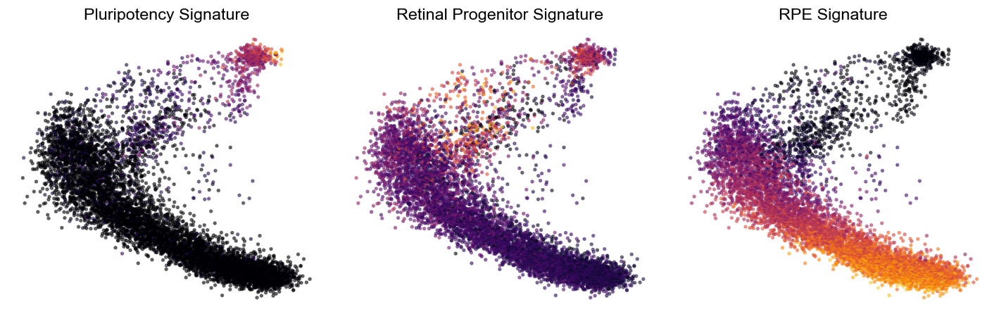

In [58]:
adata2 = adata[adata.obs["CELL_LINE"]=="E1C3"].copy()
em2 = adata2.obsm["X_pca"]

plt.figure(None, (16, 4))
gs = plt.GridSpec(1, 4)
sigs = ["Pluripotency Signature", "Retinal Progenitor Signature", "RPE Signature"]
c=0
for i in range(0, 1):
    for j in range(0, 3):
        plt.subplot(gs[i,j])
        plt.title(sigs[c])
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.axis("off")
        scatter_viz(em2[:, 0], em2[:, 1], s=5, alpha=0.5, c=np.array(adata2.obs[sigs[c]]), cmap="inferno", rasterized=True)
        c+=1
plt.tight_layout()
plt.show()

In [59]:
sig_df = adata.obs[["Pluripotency Signature", "Retinal Progenitor Signature", "RPE Signature", "DAY", "CELL_LINE"]]

In [60]:
sig_df = sig_df.groupby(["DAY", "CELL_LINE"]).mean()

In [61]:
day_means_df = sig_df.groupby("DAY").mean()
day_sem_df = sig_df.groupby("DAY").std().fillna(0)

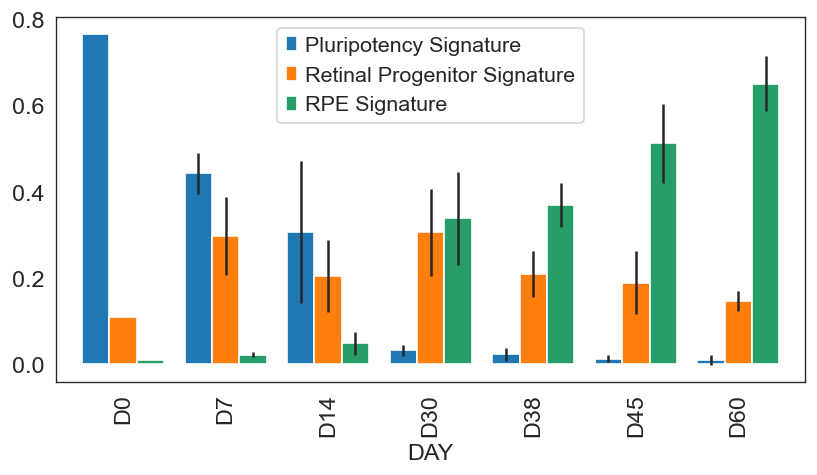

In [62]:
sns.set_style("white")
day_means_df.plot(kind="bar", yerr=day_sem_df.values.T, width=0.8, figsize=(8, 4))
plt.show()

In [63]:
day_means_df

,Pluripotency Signature,Retinal Progenitor Signature,RPE Signature
DAY,,,
D0,0.767075,0.110986,0.009456
D7,0.442652,0.298014,0.022094
D14,0.306879,0.205613,0.049176
D30,0.032410,0.306865,0.338697
D38,0.023367,0.209471,0.369645
D45,0.013591,0.189746,0.512744
D60,0.009879,0.146589,0.650925


## Global evaluation of marker genes

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result

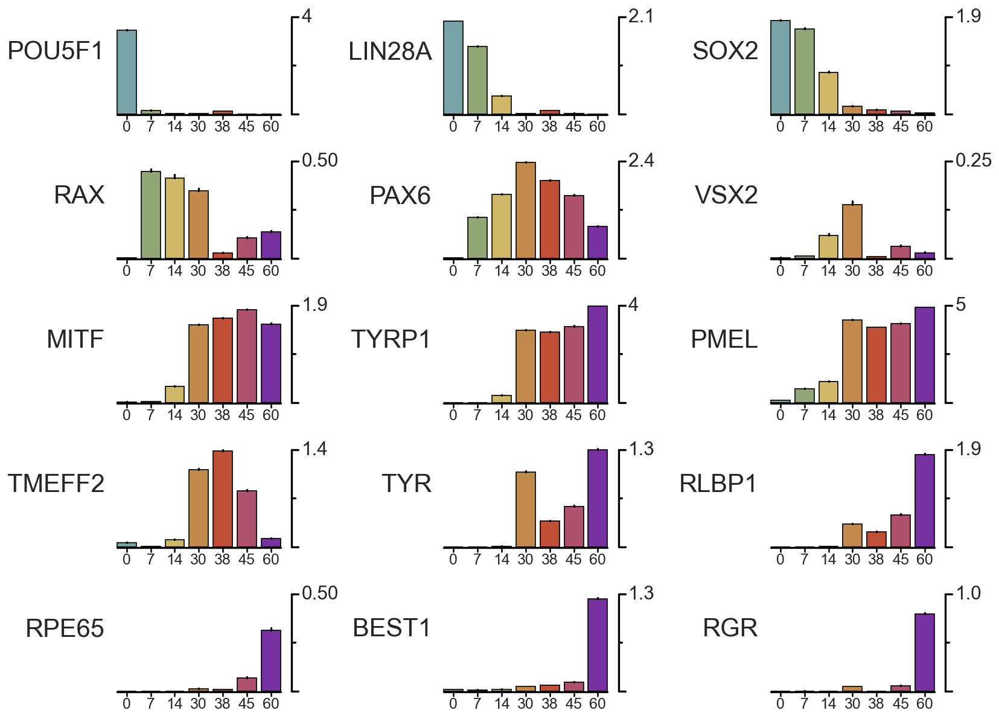

In [64]:
adata_hs980 = adata[adata.obs["CELL_LINE"]=="HS980"].copy()
d2c = {"D00":(120/255, 163/255, 167/255), "D07":(145/255, 167/255, 119/255), 
       "D14":(208/255, 184/255, 105/255), "D30":(195/255, 138/255, 77/255), 
       "D38":(192/255, 79/255, 55/255), "D45":(175/255, 82/255, 110/255), "D60":(118/255, 48/255, 159/255)}

colors = [(121,	163, 167),
          (145,	167, 119),
          (208,	184, 105),
          (195,	138, 77),
          (192,  79,  55),
          (175,  82, 110),
          (118,  48, 159)]
colors = np.array(colors)
colors = colors/255.

from scipy.stats import sem

genes = ["POU5F1", "LIN28A", "SOX2",
         "RAX", "PAX6", "VSX2",
         "MITF", "TYRP1", "PMEL",
         "TMEFF2", "TYR", "RLBP1",
         "RPE65", "BEST1", "RGR"]

n_genes = len(genes)
plt.figure(None, (14, 12))
gs = plt.GridSpec(6, 3)
cmap = plt.get_cmap('viridis')
n_samples = len(set(adata_hs980.obs["DAY"]))
colors = [d2c[i] for i in d2c.keys()]
for gene, i in zip(genes, range(0, n_genes)):
    plt.subplot(gs[i])
    group_by_cat = "DAY"
    d = pd.DataFrame(adata_hs980[:, np.where(adata_hs980.var.index==gene)[0][0]].X.toarray())
    d.columns = [gene]
    d.index = adata_hs980.obs[group_by_cat]
    dmean = d.groupby(d.index).mean()
    dstd = d.groupby(d.index).sem()
    x = np.array(dmean) 
    error_bar = np.array(dstd)
    x_ticks = ["0", "7", "14", "30", "38", "45", "60"]
    title = gene

    pretty_barplot(x, error_bar, x_ticks, title, colors, gs=gs[i])

plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


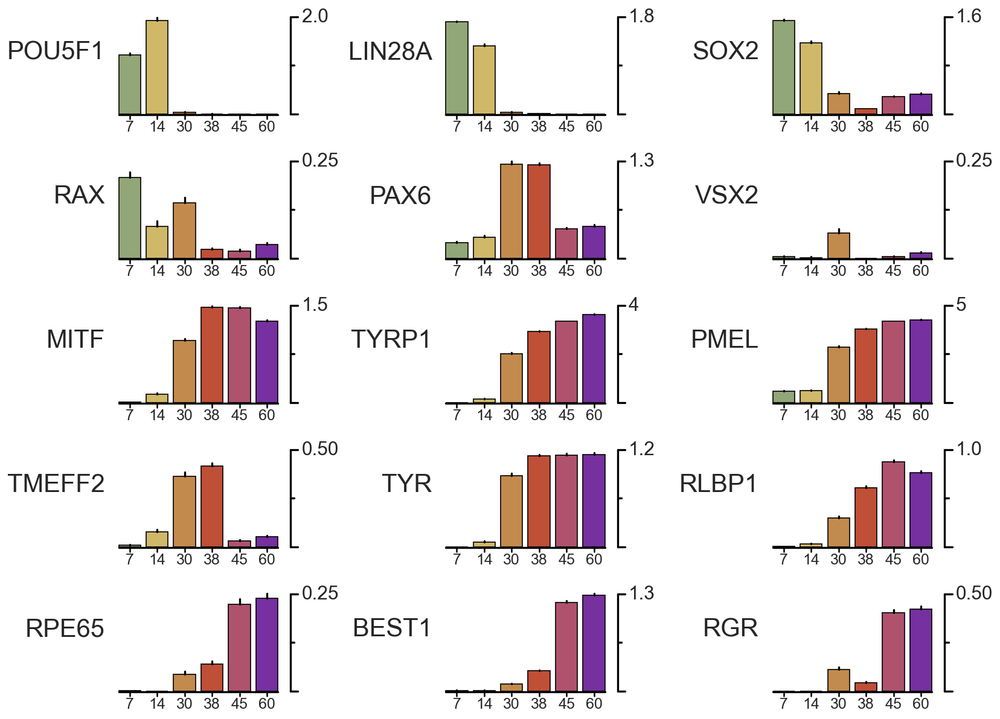

In [65]:
adata_hs980 = adata[adata.obs["CELL_LINE"]=="KARO1"].copy()
d2c = {"D07":(145/255, 167/255, 119/255), 
       "D14":(208/255, 184/255, 105/255), "D30":(195/255, 138/255, 77/255), 
       "D38":(192/255, 79/255, 55/255), "D45":(175/255, 82/255, 110/255), "D60":(118/255, 48/255, 159/255)}

colors = [(145,	167, 119),
          (208,	184, 105),
          (195,	138, 77),
          (192,  79,  55),
          (175,  82, 110),
          (118,  48, 159)]
colors = np.array(colors)
colors = colors/255.

from scipy.stats import sem

genes = ["POU5F1", "LIN28A", "SOX2",
         "RAX", "PAX6", "VSX2",
         "MITF", "TYRP1", "PMEL",
         "TMEFF2", "TYR", "RLBP1",
         "RPE65", "BEST1", "RGR"]

n_genes = len(genes)
plt.figure(None, (14, 12))
gs = plt.GridSpec(6, 3)
cmap = plt.get_cmap('viridis')
n_samples = len(set(adata_hs980.obs["DAY"]))
colors = [d2c[i] for i in d2c.keys()]
for gene, i in zip(genes, range(0, n_genes)):
    plt.subplot(gs[i])
    group_by_cat = "DAY"
    d = pd.DataFrame(adata_hs980[:, np.where(adata_hs980.var.index==gene)[0][0]].X.toarray())
    d.columns = [gene]
    d.index = adata_hs980.obs[group_by_cat]
    dmean = d.groupby(d.index).mean()
    dstd = d.groupby(d.index).sem()
    x = np.array(dmean) 
    error_bar = np.array(dstd)
    x_ticks = ["7", "14", "30", "38", "45", "60"]
    title = gene

    pretty_barplot(x, error_bar, x_ticks, title, colors, gs=gs[i])

plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


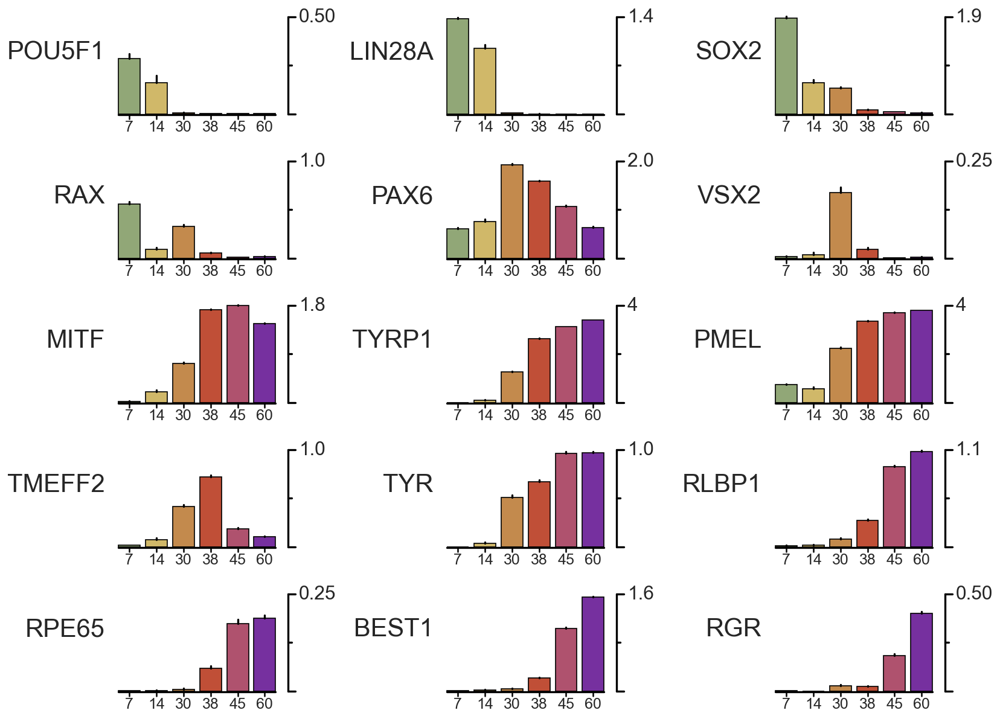

In [66]:
adata_hs980 = adata[adata.obs["CELL_LINE"]=="E1C3"].copy()
d2c = {"D07":(145/255, 167/255, 119/255), 
       "D14":(208/255, 184/255, 105/255), "D30":(195/255, 138/255, 77/255), 
       "D38":(192/255, 79/255, 55/255), "D45":(175/255, 82/255, 110/255), "D60":(118/255, 48/255, 159/255)}

colors = [(145,	167, 119),
          (208,	184, 105),
          (195,	138, 77),
          (192,  79,  55),
          (175,  82, 110),
          (118,  48, 159)]
colors = np.array(colors)
colors = colors/255.

from scipy.stats import sem

genes = ["POU5F1", "LIN28A", "SOX2",
         "RAX", "PAX6", "VSX2",
         "MITF", "TYRP1", "PMEL",
         "TMEFF2", "TYR", "RLBP1",
         "RPE65", "BEST1", "RGR"]

n_genes = len(genes)
plt.figure(None, (14, 12))
gs = plt.GridSpec(6, 3)
cmap = plt.get_cmap('viridis')
n_samples = len(set(adata_hs980.obs["DAY"]))
colors = [d2c[i] for i in d2c.keys()]
for gene, i in zip(genes, range(0, n_genes)):
    plt.subplot(gs[i])
    group_by_cat = "DAY"
    d = pd.DataFrame(adata_hs980[:, np.where(adata_hs980.var.index==gene)[0][0]].X.toarray())
    d.columns = [gene]
    d.index = adata_hs980.obs[group_by_cat]
    dmean = d.groupby(d.index).mean()
    dstd = d.groupby(d.index).sem()
    x = np.array(dmean) 
    error_bar = np.array(dstd)
    x_ticks = ["7", "14", "30", "38", "45", "60"]
    title = gene

    pretty_barplot(x, error_bar, x_ticks, title, colors, gs=gs[i])

plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:44: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


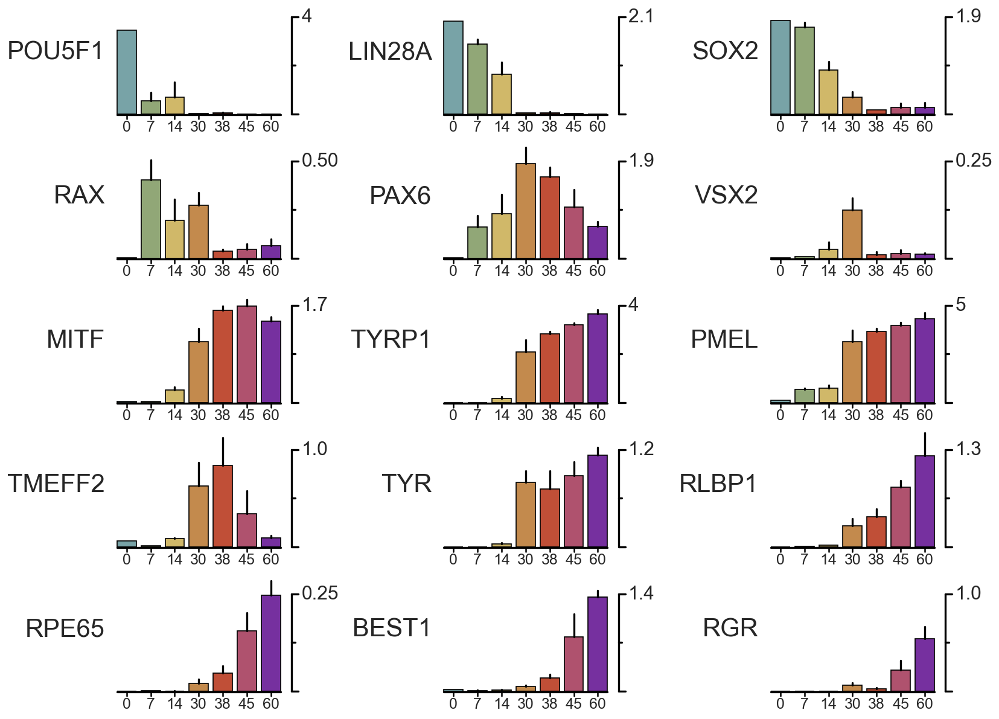

In [67]:
adata_hs980 = adata.copy()
d2c = {"D0":(120/255, 163/255, 167/255), "D07":(145/255, 167/255, 119/255), 
       "D14":(208/255, 184/255, 105/255), "D30":(195/255, 138/255, 77/255), 
       "D38":(192/255, 79/255, 55/255), "D45":(175/255, 82/255, 110/255), "D60":(118/255, 48/255, 159/255)}

colors = [(121,	163, 167),
          (145,	167, 119),
          (208,	184, 105),
          (195,	138, 77),
          (192,  79,  55),
          (175,  82, 110),
          (118,  48, 159)]
colors = np.array(colors)
colors = colors/255.

from scipy.stats import sem

genes = ["POU5F1", "LIN28A", "SOX2",
         "RAX", "PAX6", "VSX2",
         "MITF", "TYRP1", "PMEL",
         "TMEFF2", "TYR", "RLBP1",
         "RPE65", "BEST1", "RGR"]

n_genes = len(genes)
plt.figure(None, (14, 12))
gs = plt.GridSpec(6, 3)
cmap = plt.get_cmap('viridis')
n_samples = len(set(adata_hs980.obs["DAY"]))
colors = [d2c[i] for i in d2c.keys()]
for gene, i in zip(genes, range(0, n_genes)):
    plt.subplot(gs[i])#plt.subplot(gs[i,0])
    group_by_cat = "DAY"
    d = pd.DataFrame(adata_hs980[:, np.where(adata_hs980.var.index==gene)[0][0]].X.toarray())
    d.columns = [gene]
    d.index = np.array(adata_hs980.obs["CELL_LINE"])+"-"+np.array(adata_hs980.obs["DAY"])
    dmean1 = d.groupby(d.index).mean()
    dmean1.index = [i.split("-")[1] for i in dmean1.index]
    dmean2 = dmean1.groupby(dmean1.index).mean()
    dstd = dmean1.groupby(dmean1.index).sem()
    dstd = dstd.fillna(0)
    x = np.array(dmean2.loc[["D0", "D7", "D14", "D30", "D38", "D45", "D60"]]) 
    error_bar = np.array(dstd.loc[["D0", "D7", "D14", "D30", "D38", "D45", "D60"]])
    x_ticks = ["0", "7", "14", "30", "38", "45", "60"]
    title = gene

    pretty_barplot(x, error_bar, x_ticks, title, colors, gs=gs[i])

plt.tight_layout()
plt.show()

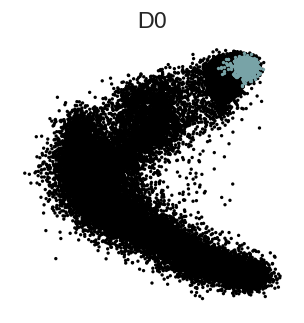

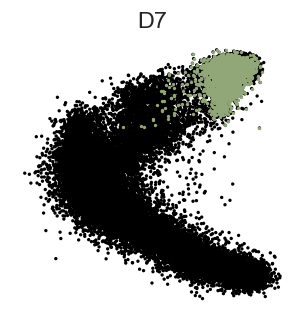

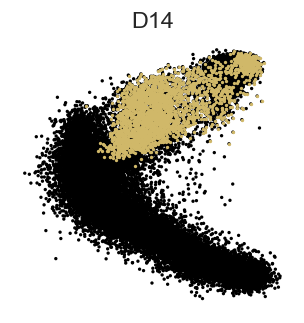

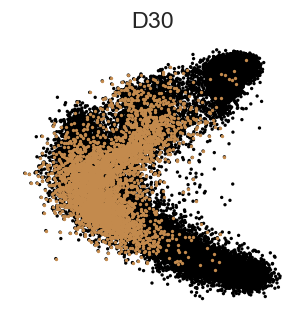

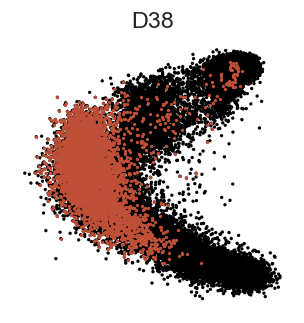

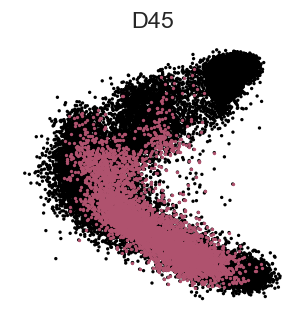

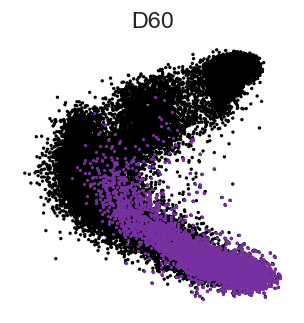

In [68]:
d2c = {"D0":(120/255, 163/255, 167/255), "D7":(145/255, 167/255, 119/255), 
       "D14":(208/255, 184/255, 105/255), "D30":(195/255, 138/255, 77/255), 
       "D38":(192/255, 79/255, 55/255), "D45":(175/255, 82/255, 110/255), "D60":(118/255, 48/255, 159/255)}

for curr_day in ["D0", "D7", "D14", "D30", "D38", "D45", "D60"]:
    em = adata_integrate_init_norm.obsm["X_pca"]
    plt.figure(None, (3, 3))
    scatter_viz(em[:, 0], em[:, 1], s=1, 
                c=np.array([(0, 0, 0) for i in adata_integrate_init_norm.obs["DAY"]]), 
                cmap="inferno", rasterized=True)
    
    em = adata_integrate_init_norm[adata_integrate_init_norm.obs["DAY"]==curr_day].obsm["X_pca"]
    scatter_viz(em[:, 0], em[:, 1], s=1, 
                c=d2c[curr_day], rasterized=True)
    plt.title(curr_day)
    plt.axis("off")
    plt.show()

In [69]:
hESCs = all_data_raw[all_data_raw.obs["DAY"]=="D0"].copy()
hESCs.obsm["X_umap"] = np.stack([hESCs.obs["INDIVIDUAL_UMAP1"], hESCs.obs["INDIVIDUAL_UMAP2"]]).T
sc.pp.normalize_total(hESCs)
sc.pp.log1p(hESCs)

... storing 'phase' as categorical


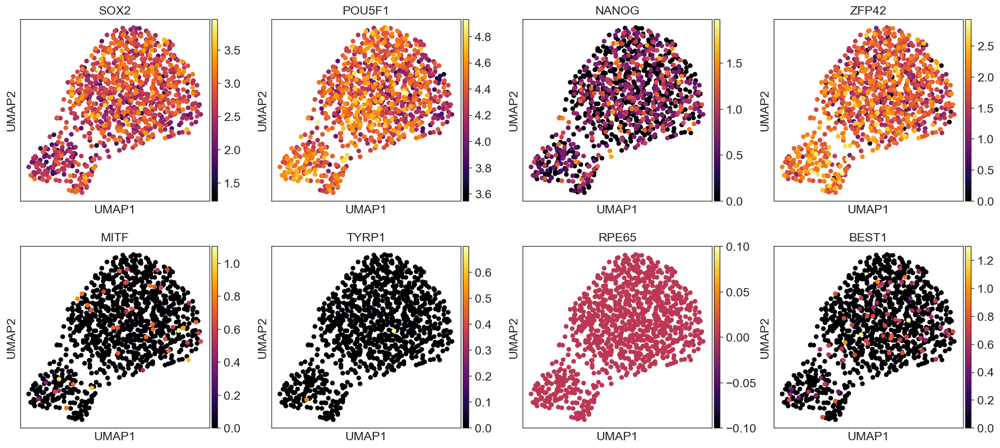

In [70]:
sc.pl.umap(hESCs, color=["SOX2", "POU5F1", "NANOG", "ZFP42", "MITF", "TYRP1", "RPE65", "BEST1"], 
           ncols=4, cmap='inferno')

In [71]:
D60_HS980 = all_data_raw[all_data_raw.obs["DAY"]=="D60"].copy()
D60_HS980 = D60_HS980[D60_HS980.obs["CELL_LINE"]=="HS980"].copy()
D60_HS980.obsm["X_umap"] = np.stack([D60_HS980.obs["INDIVIDUAL_UMAP1"], D60_HS980.obs["INDIVIDUAL_UMAP2"]]).T
sc.pp.normalize_total(D60_HS980)
sc.pp.log1p(D60_HS980)

... storing 'phase' as categorical


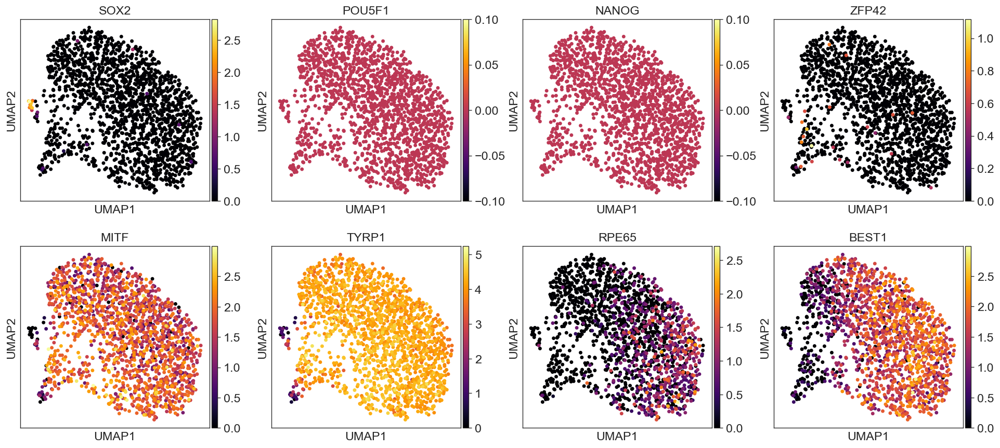

In [72]:
sc.pl.umap(D60_HS980, color=["SOX2", "POU5F1", "NANOG", "ZFP42", "MITF", "TYRP1", "RPE65", "BEST1"], 
           ncols=4, cmap='inferno')